<a href="https://colab.research.google.com/github/tugayyalcin/Detection-and-Analysis-of-Lung-Cancer/blob/main/Colorize_Images_%26_Videos_Deoldify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Install DeOldify

In [10]:
# 1. Uninstall the current incompatible version
!pip uninstall -y protobuf

# 2. Install the version that DeOldify's dependencies expect
!pip install "protobuf<3.21"

Found existing installation: protobuf 5.29.6
Uninstalling protobuf-5.29.6:
  Successfully uninstalled protobuf-5.29.6
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 8.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-api-core 2.30.0 requires protobuf<7.0.0,>=4.25.8, but you have protobuf 3.20.3 which is incompatible.
opentelemetry-proto 1.38.0 requires protobuf<7.0,>=5.0, but you have protobuf 3.20.3 which is incompatible.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 3.20.3 which is incompatible.
ydf 0.15.0 requires protobuf<7.0.0,>=5.29.1, but you have protobuf 3.20.3 which is incompatible.
tensorflow-metadata 1.17.3 requires protobuf>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.
grain 0.2.16 requires protobuf>=5.28.3, but you have protobuf 3.20.3 whic

In [1]:
!git clone https://github.com/mmaithani/DeOldify.git

fatal: destination path 'DeOldify' already exists and is not an empty directory.


In [2]:
cd DeOldify

/content/DeOldify


In [4]:
!pip install -r colab_requirements.txt --quiet

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.0/214.0 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 65.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 117.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 97.8 MB/s eta 0:00:00


## Download Models

In [3]:
!mkdir 'models'

mkdir: cannot create directory ‘models’: File exists


In [6]:
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

--2026-03-04 02:40:47--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 143.244.50.87, 2400:52e0:1a01::1115:1
Connecting to data.deepai.org (data.deepai.org)|143.244.50.87|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  4.89MB/s    in 49s     

2026-03-04 02:41:36 (4.95 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [7]:
!wget https://data.deepai.org/deoldify/ColorizeVideo_gen.pth -O ./models/ColorizeVideo_gen.pth

--2026-03-04 02:41:39--  https://data.deepai.org/deoldify/ColorizeVideo_gen.pth
Resolving data.deepai.org (data.deepai.org)... 143.244.50.89, 2400:52e0:1a01::998:1
Connecting to data.deepai.org (data.deepai.org)|143.244.50.89|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 874066230 (834M) [application/octet-stream]
Saving to: ‘./models/ColorizeVideo_gen.pth’

./models/ColorizeVi 100%[===================>] 833.57M  4.90MB/s    in 2m 50s  

2026-03-04 02:44:29 (4.90 MB/s) - ‘./models/ColorizeVideo_gen.pth’ saved [874066230/874066230]



## Import Modules

In [8]:
from deoldify import device
from deoldify.device_id import DeviceId

device.set(device=DeviceId.GPU0)

<DeviceId.GPU0: 0>

In [4]:
import collections

# This creates a bridge for the old code to find 'Iterable' where it expects it
if not hasattr(collections, 'Iterable'):
    import collections.abc
    collections.Iterable = collections.abc.Iterable
    collections.Mapping = collections.abc.Mapping
    collections.Sequence = collections.abc.Sequence

# Now you can run your original imports
from deoldify.visualize import *
import warnings
warnings.filterwarnings('ignore')

# DeOldify Images

In [8]:
# Cell 1 — compatibility patches (must be FIRST)
import collections
import collections.abc

collections.Iterable        = collections.abc.Iterable
collections.Mapping         = collections.abc.Mapping
collections.MutableMapping  = collections.abc.MutableMapping
collections.Sequence        = collections.abc.Sequence
collections.Sized           = collections.abc.Sized
collections.Callable        = collections.abc.Callable

# Fix for PyTorch 2.6: torch.load now defaults weights_only=True, breaking fastai v1
import torch
_original_torch_load = torch.load

def _patched_torch_load(f, map_location=None, pickle_module=None, **kwargs):
    kwargs['weights_only'] = False
    if pickle_module is not None:
        return _original_torch_load(f, map_location=map_location, pickle_module=pickle_module, **kwargs)
    return _original_torch_load(f, map_location=map_location, **kwargs)

torch.load = _patched_torch_load

In [9]:
# Cell 2 — now safe to import and run
from deoldify.visualize import *
import warnings
warnings.filterwarnings('ignore')

colorizer = get_image_colorizer(artistic=True)

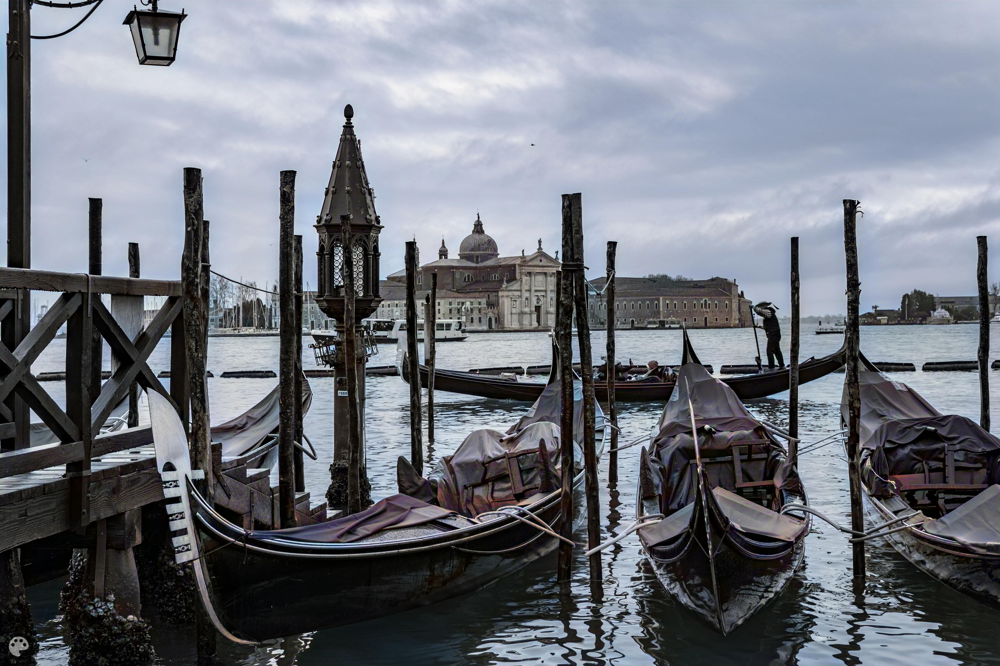

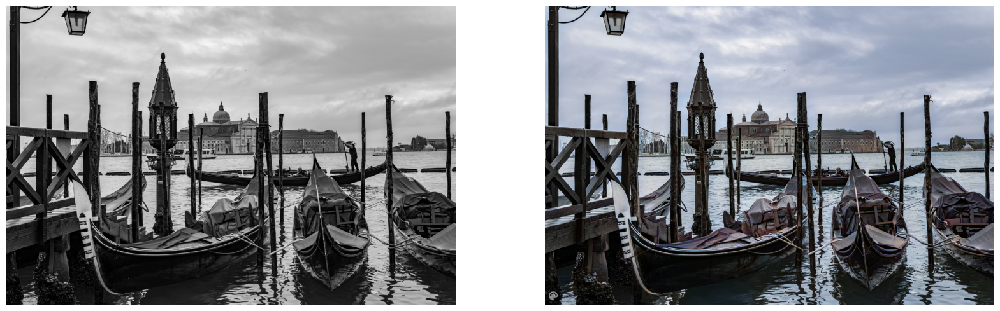

In [11]:
render_factor = 35
image_path = colorizer.plot_transformed_image(path='/content/bw_test1.jpg', render_factor=render_factor, compare=True)
show_image_in_notebook(image_path)

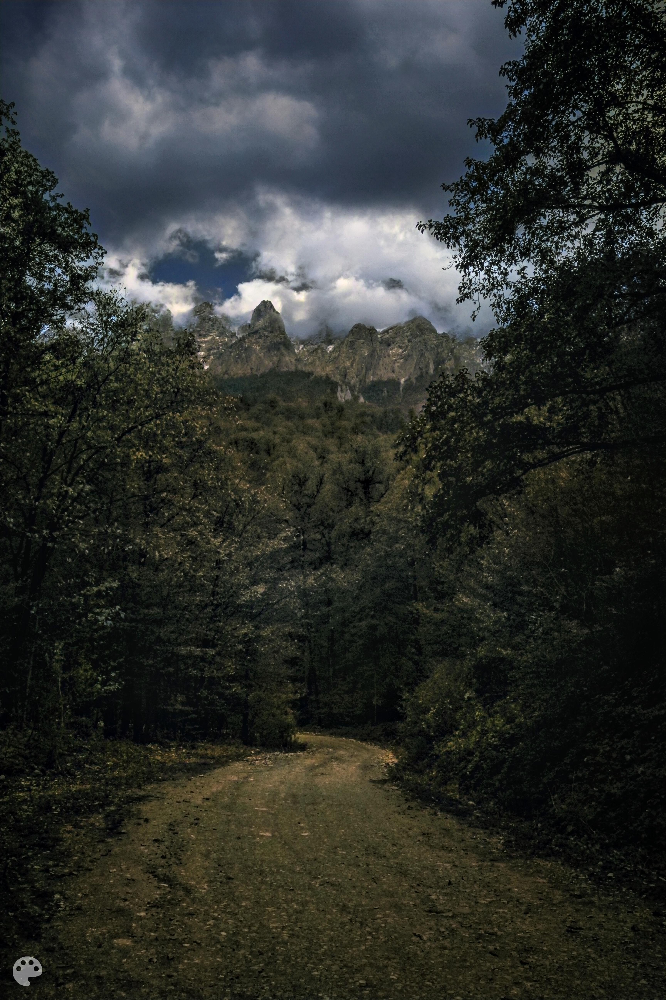

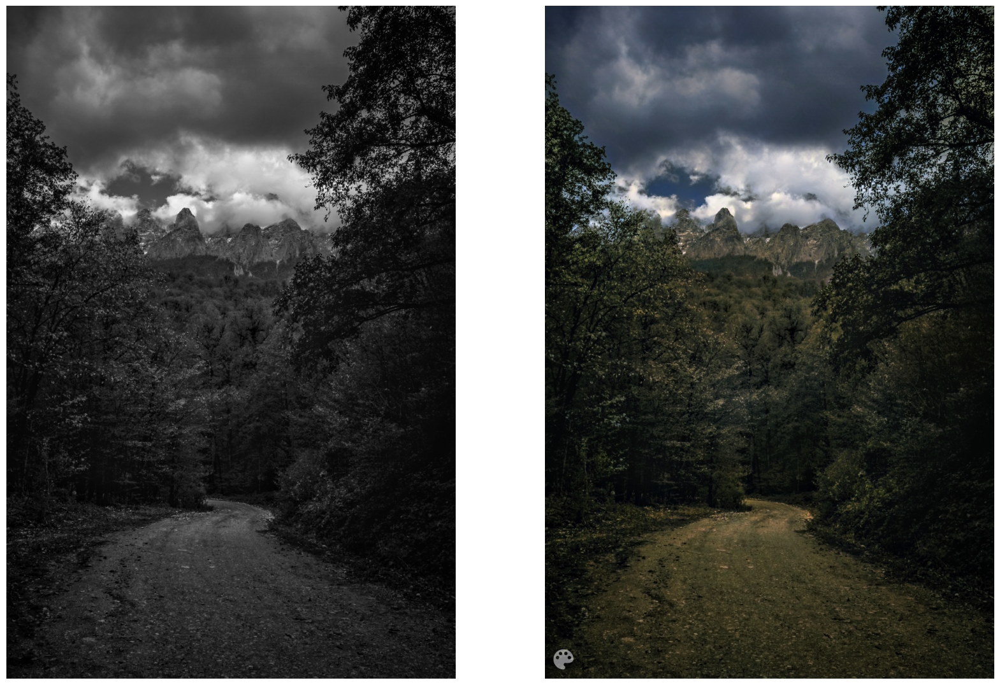

In [12]:
render_factor = 35
image_path = colorizer.plot_transformed_image(path='/content/bw_test2.jpg', render_factor=render_factor, compare=True)
show_image_in_notebook(image_path)

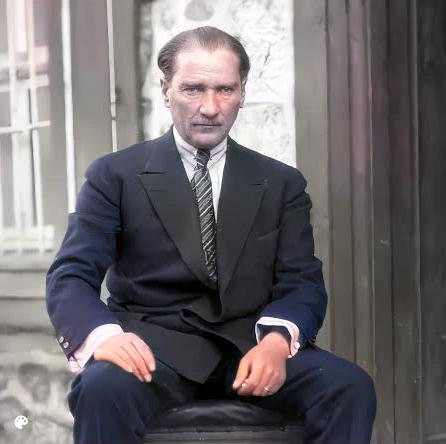

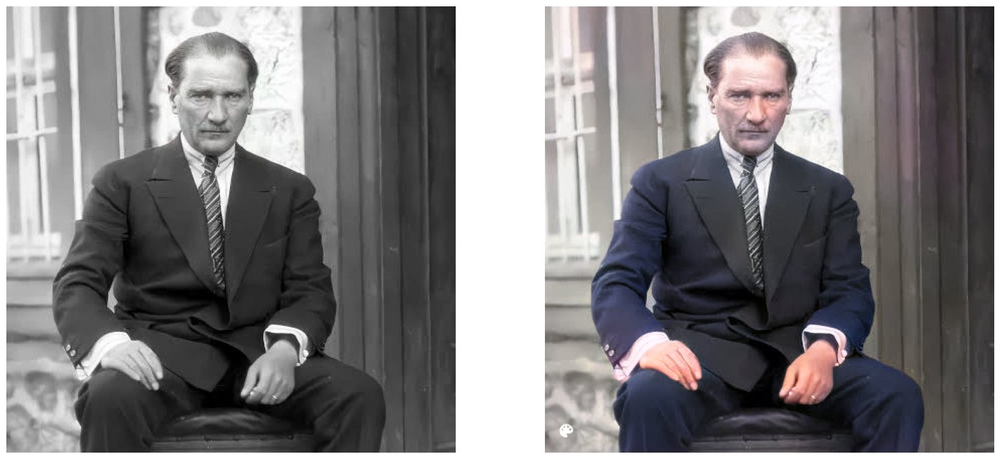

In [13]:
render_factor = 35
image_path = colorizer.plot_transformed_image(path='/content/bw_test5.jpg', render_factor=render_factor, compare=True)
show_image_in_notebook(image_path)

## DeOldify Videos

In [14]:
video_colorizer = get_video_colorizer()

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


100%|██████████| 171M/171M [00:01<00:00, 173MB/s]


In [1]:
render_factor = 35
video_path = video_colorizer.colorize_from_file_name(file_name='/content/bw_test_video.mp4', render_factor=render_factor)
show_video_in_notebook(video_path)

NameError: name 'video_colorizer' is not defined